# The code mainly implements a target detection task on the dataset EMDS-6 using the Faster R-CNN model (based on the ResNet50 FPN architecture) for recognizing 21 different biological categories.

## 1 Import necessary libraries

In [5]:
import torch
import torchvision
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import os
from PIL import Image
from PIL import ImageDraw
import torchvision.transforms as T
import numpy as np
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt
%matplotlib inline

## 2 Define category names

In [8]:
CLASS_NAMES = [
    'Actinophrys', 'Arcella', 'Aspidisca', 'Codosiga', 'Colpoda',
    'Epistylis', 'Euglypha', 'Paramecium', 'Rotifera', 'Vorticella',
    'Noctiluca', 'Ceratium', 'Stentor', 'Siprostomum', 'Keratella Quadrala',
    'Euglena', 'Gymnodinium', 'Gonyaulax', 'Phacus', 'Stylongchia', 'Synchaeta'
]

## 3 Check if the dataset exists

In [21]:
data_root = "../EMDS-6"
original_dir = os.path.join(data_root, "EMDS5-Original")
ground_truth_dir = os.path.join(data_root, "EMDS5-Ground Truth")

print("Check the dataset path:")
print(f"Does the original image directory exist: {os.path.exists(original_dir)}")
print(f"Does the Ground Truth directory exist: {os.path.exists(ground_truth_dir)}")

Check the dataset path:
Does the original image directory exist: True
Does the Ground Truth directory exist: True


## 4 Load Dataset

In [24]:
class EMSDDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.imgs = []
        self.annotations = []

        print("Starting to load the dataset...")

        # Iterate through all category folders
        for class_id in range(1, 22):  # 21 categories
            class_dir = f"{class_id:02d}"
            img_dir = os.path.join(root_dir, "EMDS5-Original", class_dir)
            anno_dir = os.path.join(root_dir, "EMDS5-Ground Truth", class_dir)

            if not os.path.exists(img_dir) or not os.path.exists(anno_dir):
                print(f"Warning: Directory does not exist - {img_dir} or {anno_dir}")
                continue

            # Get all images in this category
            for img_name in os.listdir(img_dir):
                if img_name.endswith(('.png', '.jpg', '.jpeg')):
                    img_path = os.path.join(img_dir, img_name)
                    # Construct the corresponding Ground Truth file name
                    anno_name = img_name.replace('.png', '-GTM.png')
                    anno_path = os.path.join(anno_dir, anno_name)

                    if os.path.exists(anno_path):
                        self.imgs.append(img_path)
                        self.annotations.append(anno_path)
                    else:
                        print(f"Warning: Corresponding annotation file not found - {anno_path}")

        print(f"Dataset loading completed. There are {len(self.imgs)} images in total.")

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        # Load the image
        img_path = self.imgs[idx]
        img = Image.open(img_path).convert("RGB")

        # Load the annotation image
        anno_path = self.annotations[idx]
        mask = Image.open(anno_path).convert("L")

        # Get the bounding box
        mask_np = np.array(mask)
        pos = np.where(mask_np > 0)
        if len(pos[0]) > 0:
            xmin = np.min(pos[1])
            xmax = np.max(pos[1])
            ymin = np.min(pos[0])
            ymax = np.max(pos[0])
            boxes = torch.tensor([[xmin, ymin, xmax, ymax]], dtype=torch.float32)
        else:
            boxes = torch.zeros((0, 4), dtype=torch.float32)

        # Get the class label
        class_id = int(img_path.split(os.sep)[-2]) - 1  # Category index starting from 0
        labels = torch.tensor([class_id + 1], dtype=torch.int64)  # Categories start from 1

        # Apply the transformation
        if self.transform:
            img = self.transform(img)

        # Create the target dictionary
        target = {}
        target["boxes"] = boxes
        target["labels"] = labels

        return img, target

In [30]:
# Define the transformation
def get_transform():
    transforms = []
    transforms.append(T.ToTensor())
    return T.Compose(transforms)

# Create a dataset instance
dataset = EMSDDataset(root_dir="../EMDS-6", transform=get_transform())
data_loader = DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

Starting to load the dataset...
Dataset loading completed. There are 840 images in total.


## 5 Setting up the device

In [33]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(f'Using device: {device}')

Using device: cuda


## 6 Create models

In [36]:
def get_model(num_classes):
    model = fasterrcnn_resnet50_fpn(pretrained=True)
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

# Load the model
num_classes = len(CLASS_NAMES) + 1  # 21 categories + background
model = get_model(num_classes)
model.to(device)

E:\anaconda\envs\pytorch\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
E:\anaconda\envs\pytorch\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


FasterRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): FrozenBatchNorm2d(64, eps=0.0)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): FrozenBatchNorm2d(64, eps=0.0)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): FrozenBatchNorm2d(64, eps=0.0)
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn3): FrozenBatchNorm2d(256, eps=0.0)
          (relu): ReLU(

## 7 Display and save results

In [38]:
def train_model(model, data_loader, optimizer, device, num_epochs=10):
    model.train()
    for epoch in range(num_epochs):
        print(f"Epoch {epoch+1}/{num_epochs}")
        
        for i, (images, targets) in enumerate(data_loader):
            images = [image.to(device) for image in images]
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
            
            optimizer.zero_grad()
            loss_dict = model(images, targets)
            
            losses = sum(loss for loss in loss_dict.values())
            losses.backward()
            optimizer.step()
            
            if i % 10 == 0:
                print(f"Batch {i}, Loss: {losses.item():.4f}")
        
        print(f"Epoch {epoch+1} completed")

In [40]:
# Set up the optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=0.005, momentum=0.9, weight_decay=0.0005)

# Train the model
train_model(model, data_loader, optimizer, device, num_epochs=10)

# Save the model
torch.save(model.state_dict(), 'faster_rcnn_emsd.pth')

Epoch 1/10
Batch 0, Loss: 3.4055
Batch 10, Loss: 0.2968
Batch 20, Loss: 0.2092
Batch 30, Loss: 0.3009
Batch 40, Loss: 0.2862
Batch 50, Loss: 0.4490
Batch 60, Loss: 0.2572
Batch 70, Loss: 0.2423
Batch 80, Loss: 0.2405
Batch 90, Loss: 0.2930
Batch 100, Loss: 0.3342
Batch 110, Loss: 0.2038
Batch 120, Loss: 0.2629
Batch 130, Loss: 0.2640
Batch 140, Loss: 0.2880
Batch 150, Loss: 0.3462
Batch 160, Loss: 0.2399
Batch 170, Loss: 0.2521
Batch 180, Loss: 0.1991
Batch 190, Loss: 0.3186
Batch 200, Loss: 0.2668
Batch 210, Loss: 0.2442
Batch 220, Loss: 0.2386
Batch 230, Loss: 0.1822
Batch 240, Loss: 0.2931
Batch 250, Loss: 0.3162
Batch 260, Loss: 0.2554
Batch 270, Loss: 0.3039
Batch 280, Loss: 0.2593
Batch 290, Loss: 0.2963
Batch 300, Loss: 0.2854
Batch 310, Loss: 0.2830
Batch 320, Loss: 0.2183
Batch 330, Loss: 0.2746
Batch 340, Loss: 0.2177
Batch 350, Loss: 0.2577
Batch 360, Loss: 0.2404
Batch 370, Loss: 0.2079
Batch 380, Loss: 0.2913
Batch 390, Loss: 0.2478
Batch 400, Loss: 0.2772
Batch 410, Loss:

In [45]:
def plot_results(img, boxes, scores, labels):
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    ax = plt.gca()

    for box, score, label in zip(boxes, scores, labels):
        if score > 0.5:  # Confidence threshold
            x1, y1, x2, y2 = box
            rect = plt.Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, edgecolor='red', linewidth=2)
            ax.add_patch(rect)
            class_name = CLASS_NAMES[label - 1]  # Since labels start from 1
            plt.text(x1, y1, f'{class_name}\n{score:.2f}', 
                     bbox=dict(facecolor='yellow', alpha=0.5))

    plt.axis('off')
    plt.show()

C:\Users\Jennifer\AppData\Local\Temp\ipykernel_26604\2086782693.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('faster_rcnn_emsd.pth'))


Processing the image of class Actinophrys: EMDS5-g01-01.png


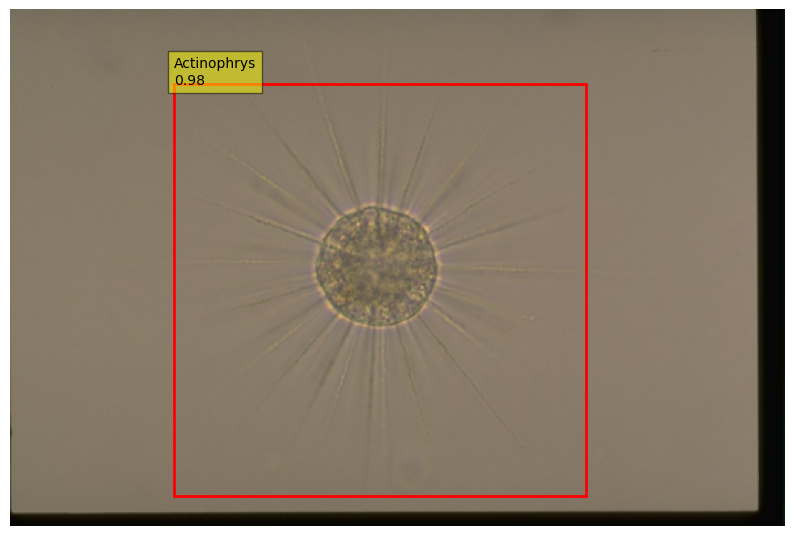


Processing the image of class Arcella: EMDS5-g02-01.png


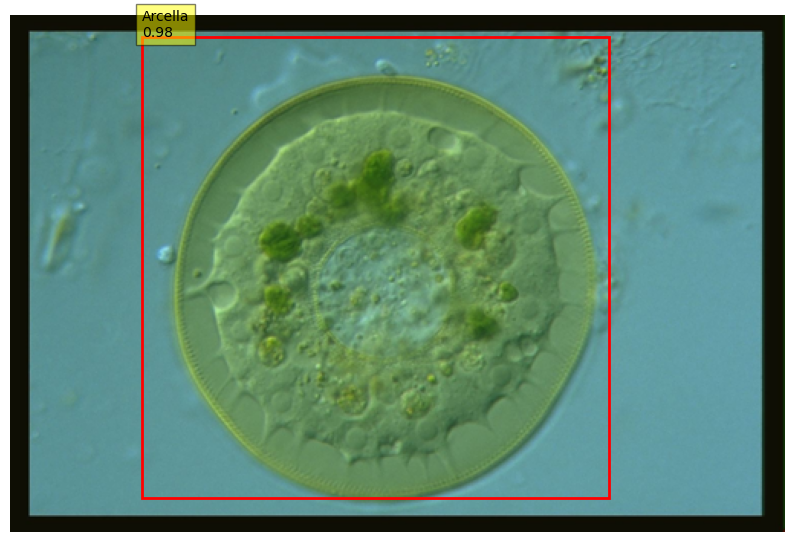


Processing the image of class Aspidisca: EMDS5-g03-01.png


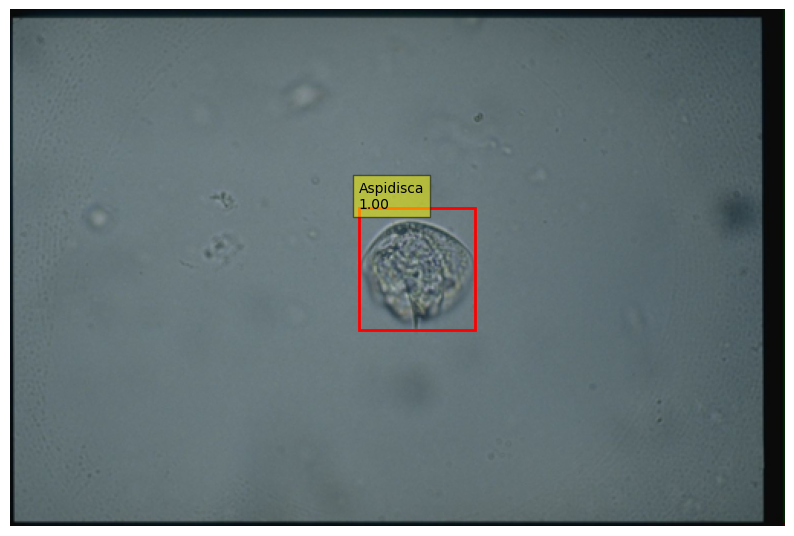


Processing the image of class Codosiga: EMDS5-g04-01.png


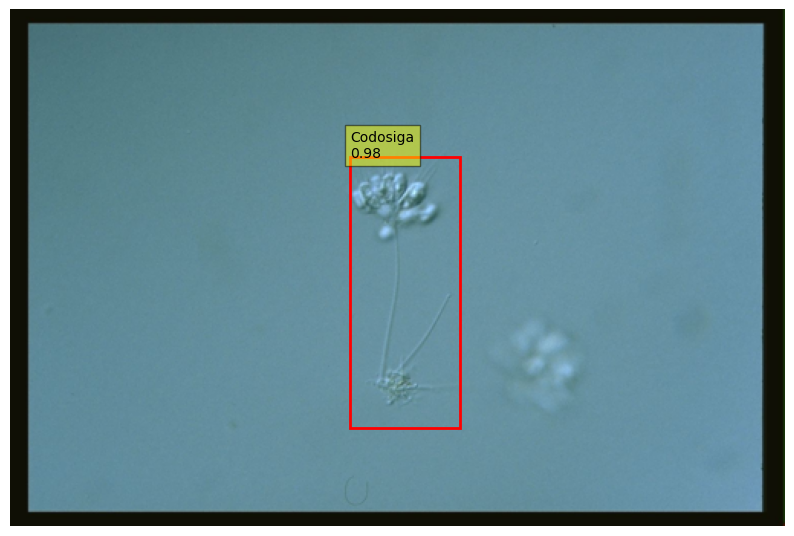


Processing the image of class Colpoda: EMDS5-g05-01.png


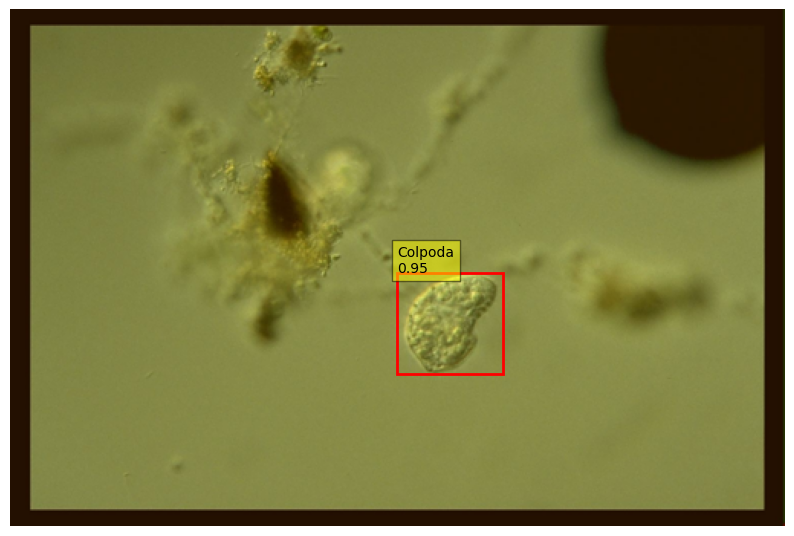


Processing the image of class Epistylis: EMDS5-g06-01.png


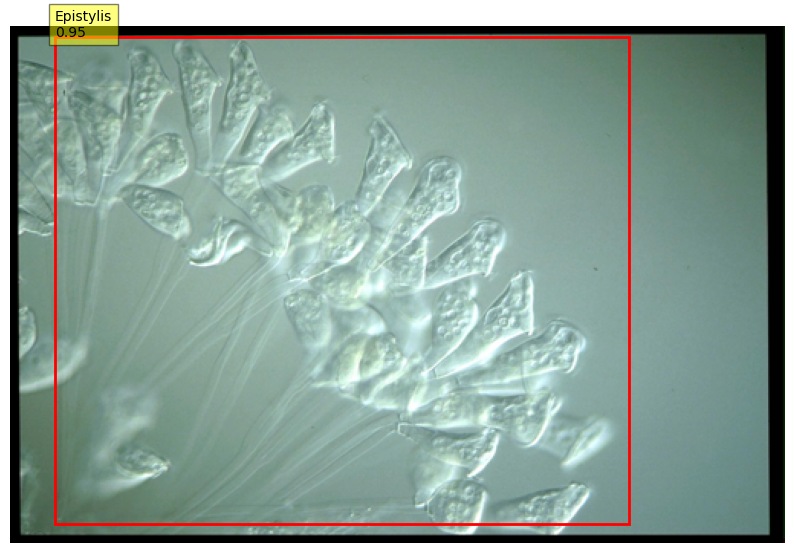


Processing the image of class Euglypha: EMDS5-g07-01.png


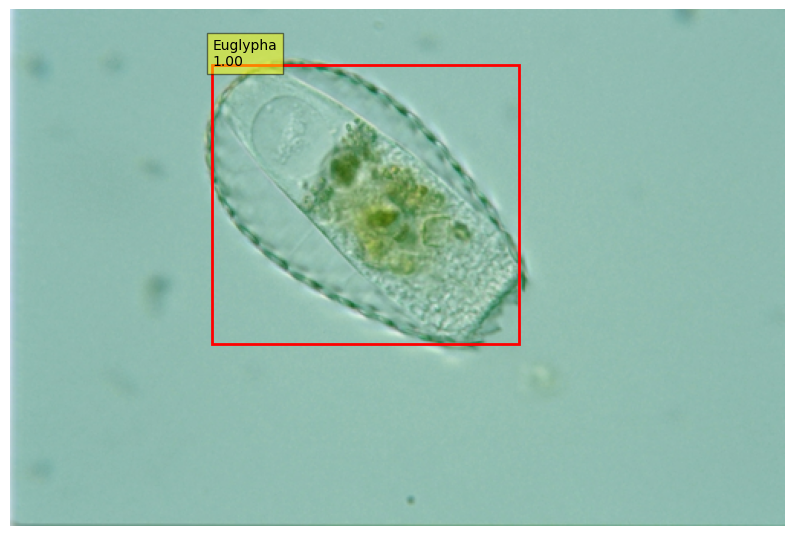


Processing the image of class Paramecium: EMDS5-g08-01.png


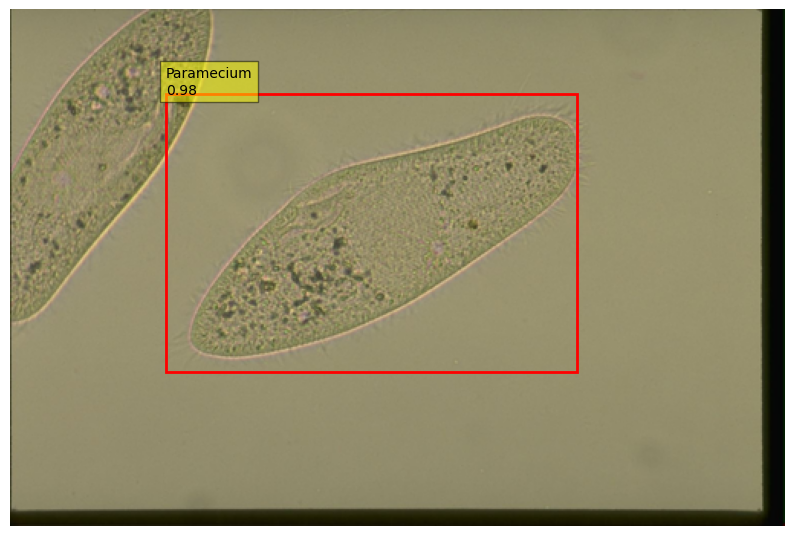


Processing the image of class Rotifera: EMDS5-g09-01.png


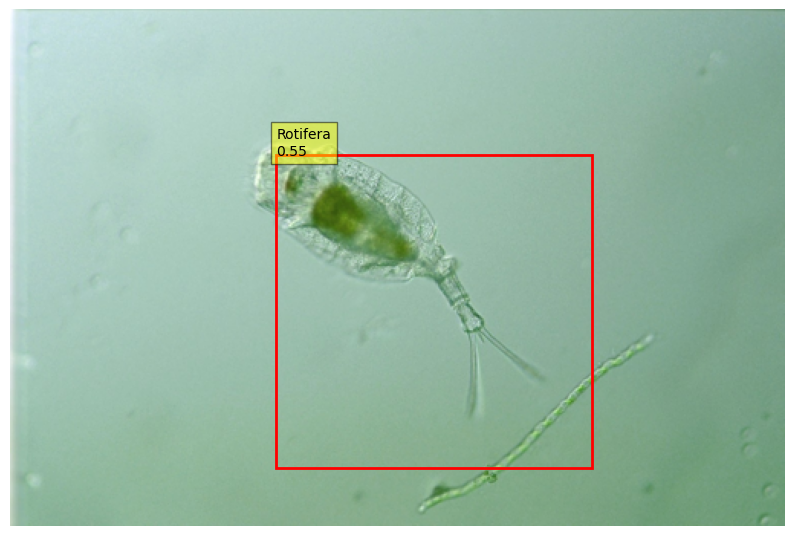


Processing the image of class Vorticella: EMDS5-g10-01.png


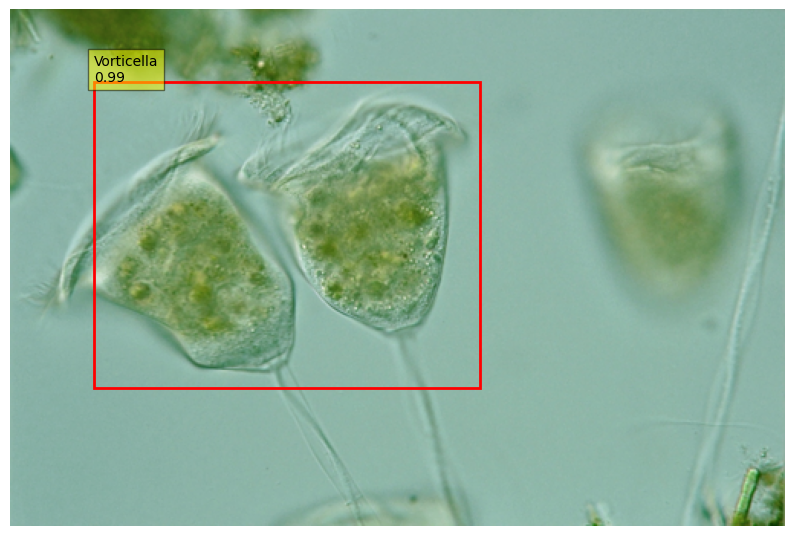


Processing the image of class Noctiluca: EMDS5-g11-01.png


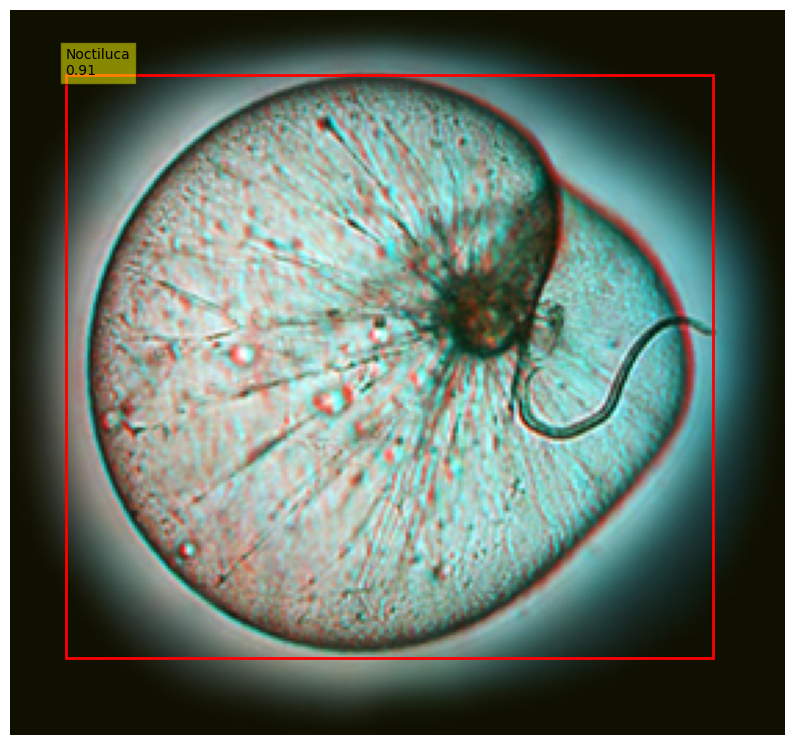


Processing the image of class Ceratium: EMDS5-g12-01.png


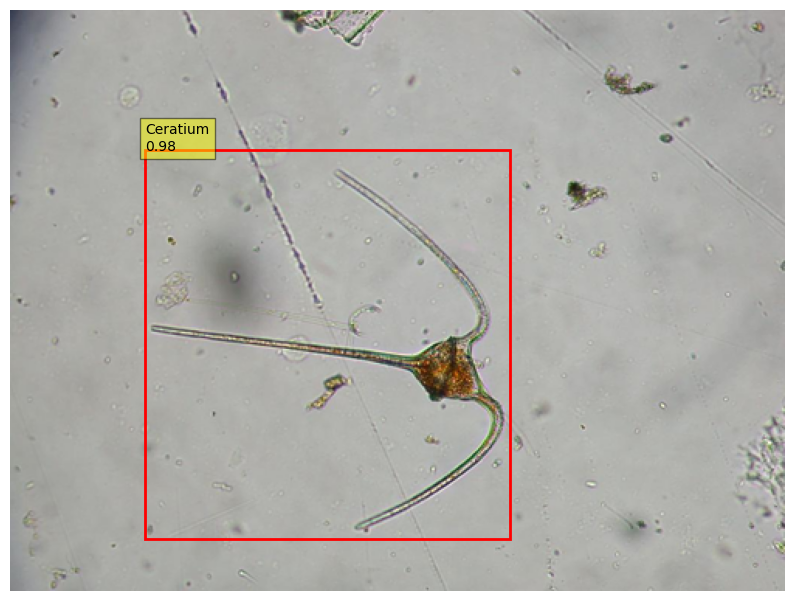


Processing the image of class Stentor: EMDS5-g13-01.png


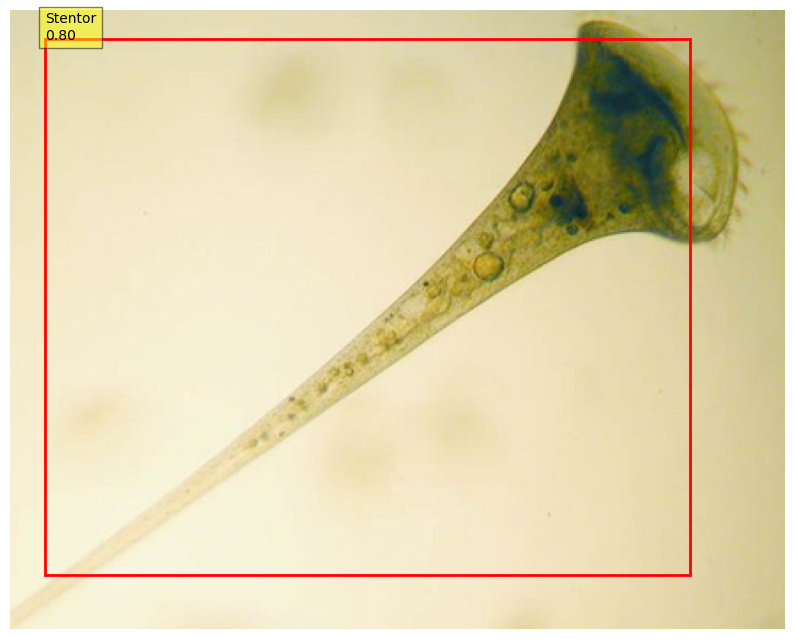


Processing the image of class Siprostomum: EMDS5-g14-01.png


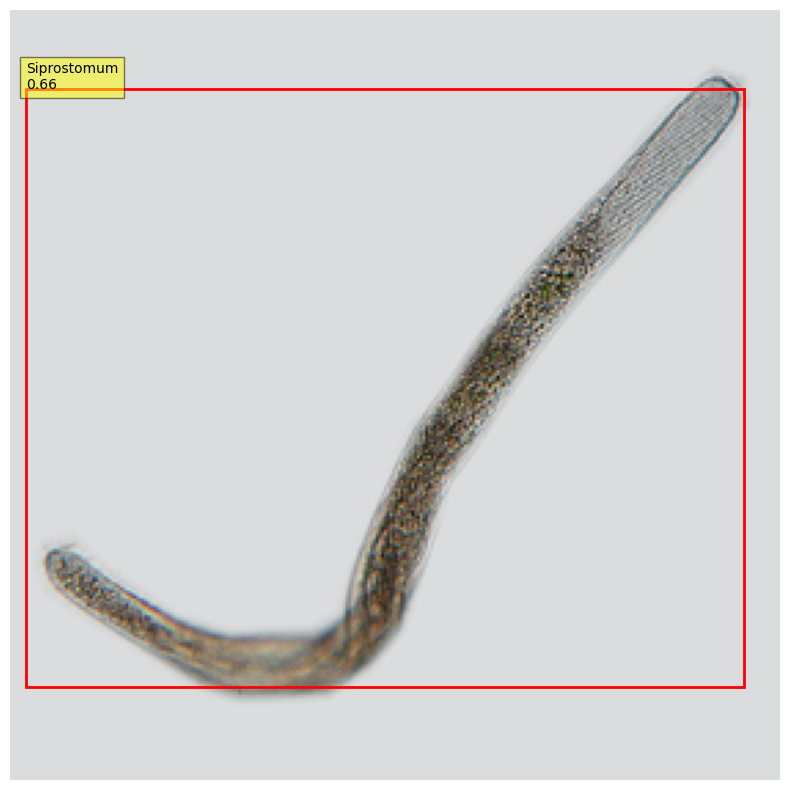


Processing the image of class Keratella Quadrala: EMDS5-g15-01.png


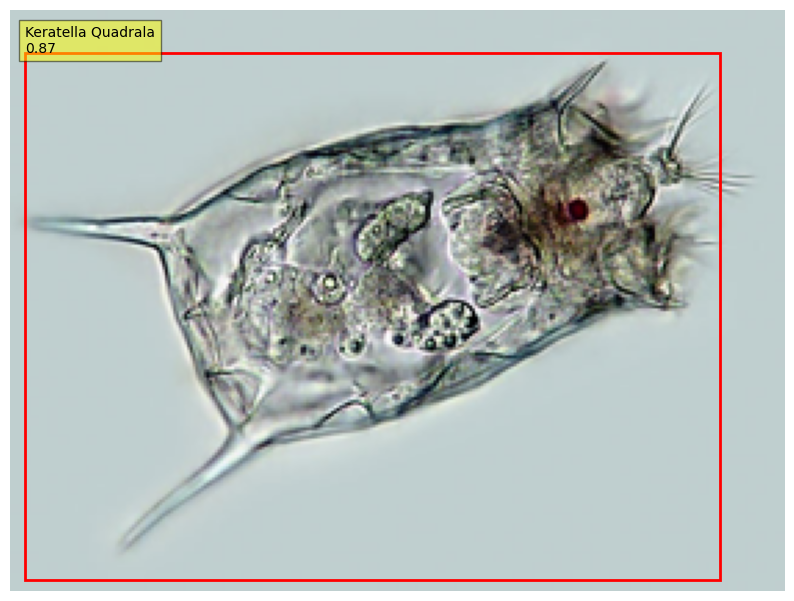


Processing the image of class Euglena: EMDS5-g16-01.png


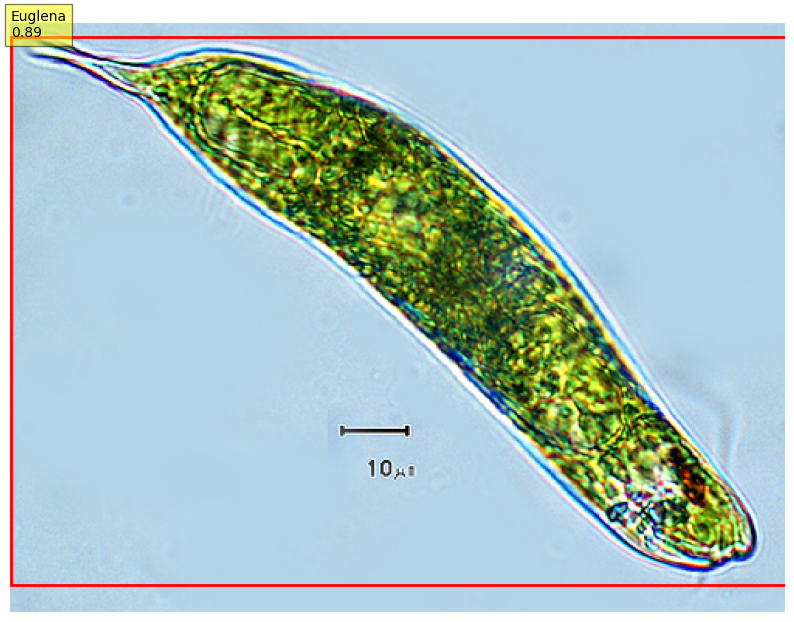


Processing the image of class Gymnodinium: EMDS5-g17-01.png


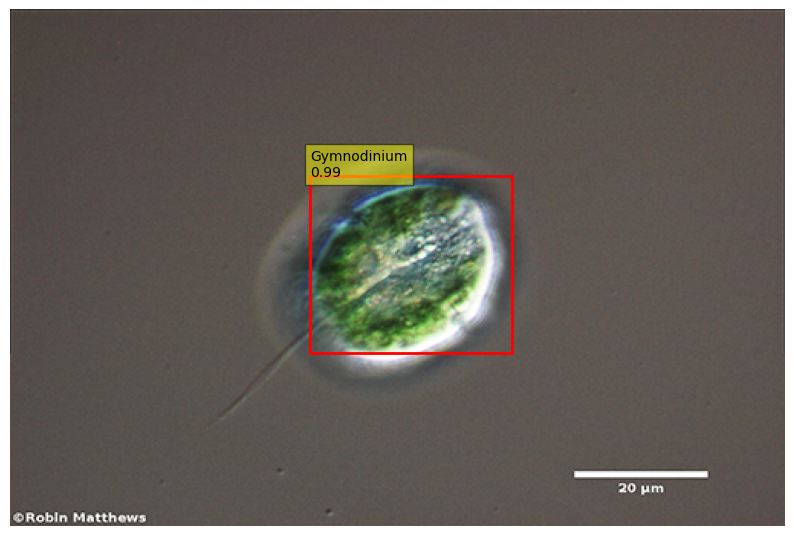


Processing the image of class Gonyaulax: EMDS5-g18-01.png


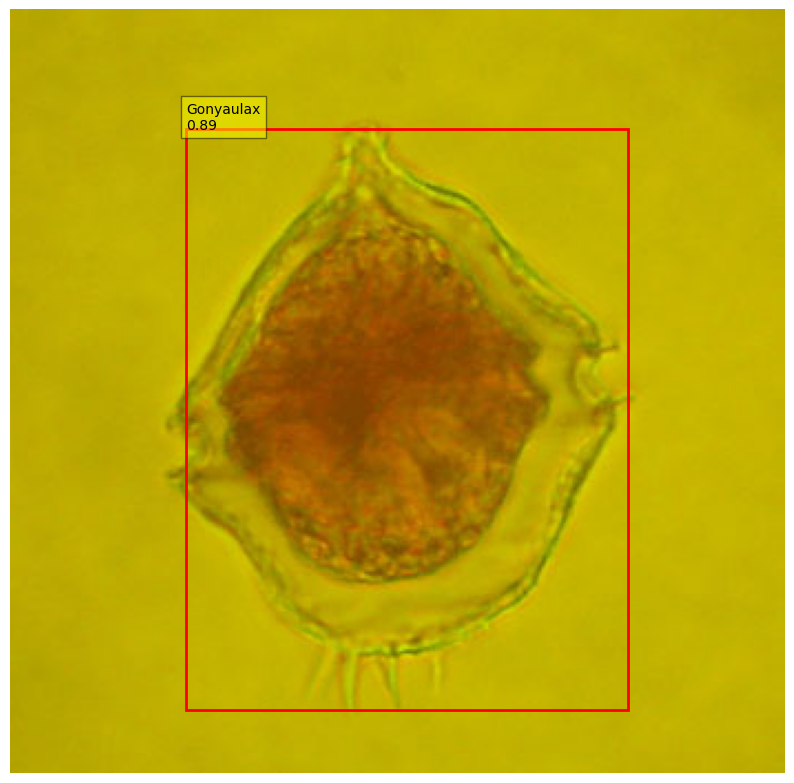


Processing the image of class Phacus: EMDS5-g19-01.png


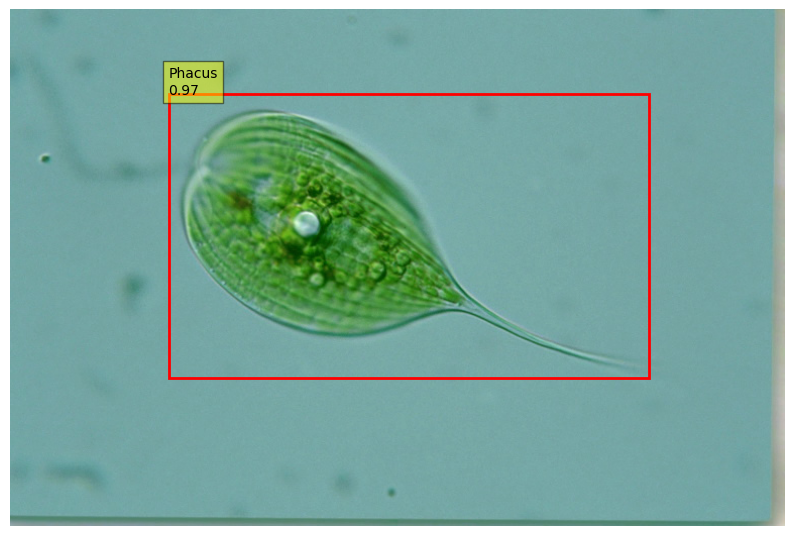


Processing the image of class Stylongchia: EMDS5-g20-01.png


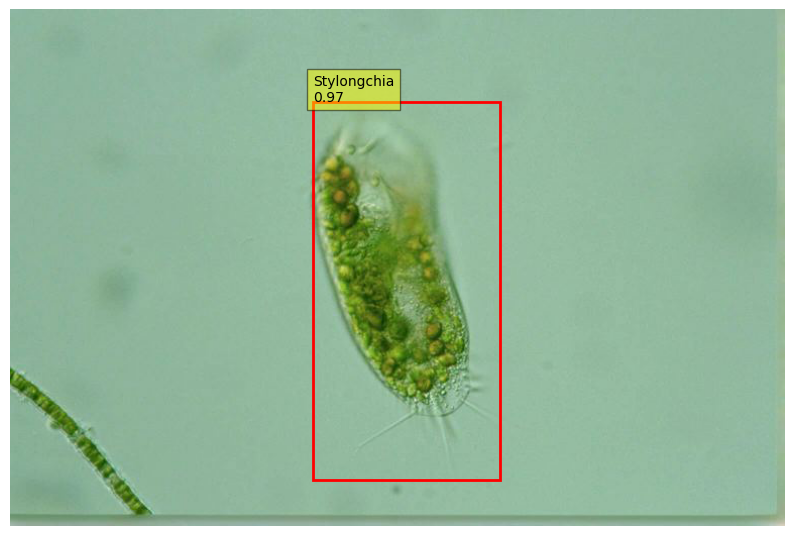


Processing the image of class Synchaeta: EMDS5-g21-01.png


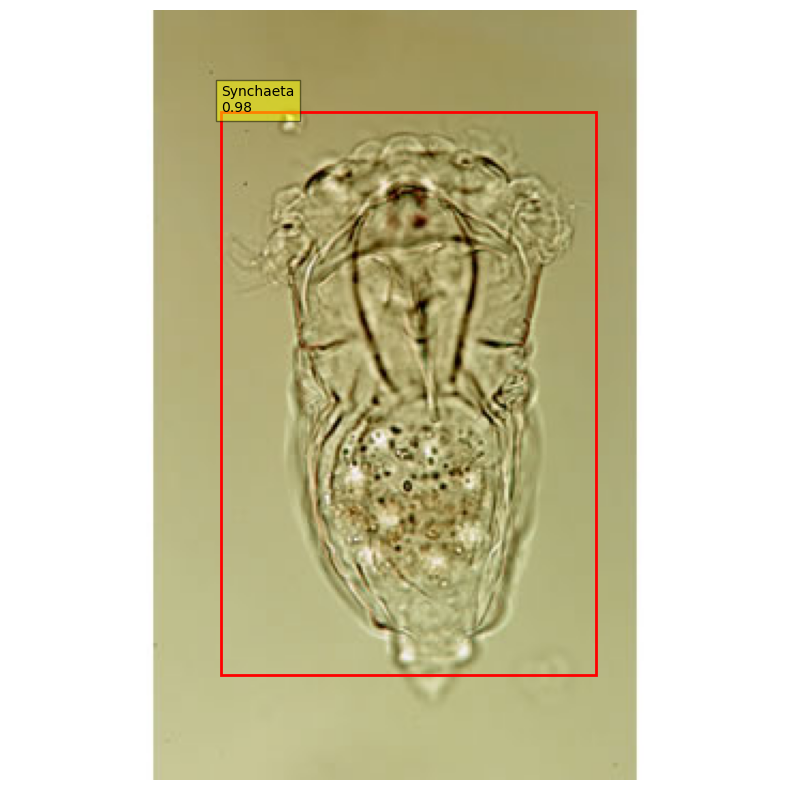

In [49]:
# Load the trained model
model.load_state_dict(torch.load('faster_rcnn_emsd.pth'))
model.eval()

# Test images
test_dir = "../EMDS-6/EMDS5-Original"
for class_id in range(1, 22):
    class_dir = f"{class_id:02d}"
    img_dir = os.path.join(test_dir, class_dir)

    # Get the first image of this class for testing
    for img_name in os.listdir(img_dir):
        if img_name.endswith(('.jpg', '.png', '.jpeg')):
            img_path = os.path.join(img_dir, img_name)
            print(f"\nProcessing the image of class {CLASS_NAMES[class_id - 1]}: {img_name}")

            # Load and preprocess the image
            img = Image.open(img_path).convert("RGB")
            img_tensor = get_transform()(img)
            img_tensor = img_tensor.unsqueeze(0)
            img_tensor = img_tensor.to(device)

            # Make predictions
            with torch.no_grad():
                prediction = model(img_tensor)

            # Process the prediction results
            boxes = prediction[0]['boxes'].cpu().numpy()
            scores = prediction[0]['scores'].cpu().numpy()
            labels = prediction[0]['labels'].cpu().numpy()

            # Display the results
            plot_results(np.array(img), boxes, scores, labels)
            break  # Only test the first image of each class

In [48]:
# Create the root directory to save the results
output_root_dir = "output_images"
os.makedirs(output_root_dir, exist_ok=True)

# Load the trained model
model.load_state_dict(torch.load('faster_rcnn_emsd.pth'))
model.eval()

# Test images
test_dir = "../EMDS-6/EMDS5-Original"
for class_id in range(1, 22):
    class_dir = f"{class_id:02d}"
    img_dir = os.path.join(test_dir, class_dir)

    # Create the directory for the class
    output_dir = os.path.join(output_root_dir, class_dir)
    os.makedirs(output_dir, exist_ok=True)

    for img_name in os.listdir(img_dir):
        if img_name.endswith(('.jpg', '.png', '.jpeg')):
            img_path = os.path.join(img_dir, img_name)
            print(f"\nProcessing the image of class {CLASS_NAMES[class_id - 1]}: {img_name}")

            # Load and preprocess the image
            img = Image.open(img_path).convert("RGB")
            img_tensor = get_transform()(img)
            img_tensor = img_tensor.unsqueeze(0)
            img_tensor = img_tensor.to(device)

            # Make predictions
            with torch.no_grad():
                prediction = model(img_tensor)

            # Process the prediction results
            boxes = prediction[0]['boxes'].cpu().numpy()
            scores = prediction[0]['scores'].cpu().numpy()
            labels = prediction[0]['labels'].cpu().numpy()

            # Draw the results
            draw = ImageDraw.Draw(img)
            for box, score, label in zip(boxes, scores, labels):
                if score > 0.5:  # Confidence threshold
                    x1, y1, x2, y2 = box
                    draw.rectangle([x1, y1, x2, y2], outline="red", width=2)
                    draw.text((x1, y1), f"{CLASS_NAMES[label - 1]}: {score:.2f}", fill="red")

            # Save the results
            output_path = os.path.join(output_dir, img_name)
            img.save(output_path)
            print(f"Results saved to {output_path}")

C:\Users\Jennifer\AppData\Local\Temp\ipykernel_6584\1039398211.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('faster_rcnn_emsd.pth'))



Processing the image of class Actinophrys: EMDS5-g01-01.png
Results saved to output_images\01\EMDS5-g01-01.png

Processing the image of class Actinophrys: EMDS5-g01-02.png
Results saved to output_images\01\EMDS5-g01-02.png

Processing the image of class Actinophrys: EMDS5-g01-03.png
Results saved to output_images\01\EMDS5-g01-03.png

Processing the image of class Actinophrys: EMDS5-g01-04.png
Results saved to output_images\01\EMDS5-g01-04.png

Processing the image of class Actinophrys: EMDS5-g01-05.png
Results saved to output_images\01\EMDS5-g01-05.png

Processing the image of class Actinophrys: EMDS5-g01-06.png
Results saved to output_images\01\EMDS5-g01-06.png

Processing the image of class Actinophrys: EMDS5-g01-07.png
Results saved to output_images\01\EMDS5-g01-07.png

Processing the image of class Actinophrys: EMDS5-g01-08.png
Results saved to output_images\01\EMDS5-g01-08.png

Processing the image of class Actinophrys: EMDS5-g01-09.png
Results saved to output_images\01\EMDS5-g01